In [1]:
import sys
#del sys.modules['grid.grouping']
#del sys.modules['trainers.doc2vec_trainer']
#del sys.modules['trainers.cluster_trainer']

from grid.grouping import Grouping 
from gensim import corpora, models
from gensim.utils import simple_preprocess
from sklearn.feature_extraction.text import CountVectorizer
from trainers.doc2vec_trainer import Doc2VecTrainer
from trainers.cluster_trainer import ClusterTrainer
from time import time
import csv

def corpus_record_to_dict(row):
    record_dict = dict(index=row.get("index"),
        title=row.get("title"),
        article_text=row.get("article_text"),
        docvec=row.get("docvec"))
    return record_dict

def csv_to_list(csvfilename, field=-1):
    rows = []
    with open(csvfilename, newline='') as csvfile:
        reader = csv.reader(csvfile)
        for row in reader:
            rows.append(row[field])
    return rows

def print_terms(name, most_unique_terms, tfidf_scores, limit=10):

    print('{} top terms:'.format(name))
    i = 0
    for term, frequency in most_unique_terms.items():
        print('{} Frequency: {}'.format(term, frequency))
        i += 1
        if i > limit:
            break

    i = 0
    for term, tfidf in tfidf_scores.items():
        print('{} TF*IDF score: {}'.format(term, tfidf))
        i += 1
        if i > limit:
            break


In [2]:
doc2vec = Doc2VecTrainer(epochs=200,
                         min_count=10,
                         vector_size=300,
                         window=15)
print("Building corpus...")
doc2vec.add_corpus('../data/all_brexit_articles.csv')


Building corpus...


In [3]:
print("Training Doc2Vec...")
doc2vec.build_model()
doc2vec.add_docvecs()

Training Doc2Vec...


In [4]:
print("Building Clustering...")
ct = ClusterTrainer(100, doc2vec.corpus)
reduced_docvecs_five_dims = ct.build_reduced(pca_dim = 300, umap_dim = 5)
labels = ct.build_clusters(reduced_docvecs_five_dims)
reduced_docvecs_two_dims = ct.build_reduced(pca_dim = 300,umap_dim = 2)
ct.assign_dims_and_labels(reduced_docvecs_two_dims, labels)
docs = ct.docs

Building Clustering...


In [5]:
filename = '../data/stopwords-en.csv'
stoplist = csv_to_list(filename)
grouping = Grouping(docs, stoplist)

In [6]:
with open('dictionary.txt', 'r') as f:
    dictionary = set(f.readlines())

In [7]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(20,10))

def get_cmap(n, name='rainbow'):
    '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct 
    RGB color; the keyword argument name must be a standard mpl colormap name.'''
    return plt.cm.get_cmap(name, n)

cmap = get_cmap(len(grouping.clusters))

best_words = {}
for label, cluster in grouping.clusters.items():
    c = np.array(cmap(label)).reshape(1,4)
    x = [doc.dim_one for doc in cluster.docs]
    y = [doc.dim_two for doc in cluster.docs]
    x_mean = np.mean(x)
    y_mean = np.mean(y)
    
    max_tfidf = 0
    best_word = ''
    for tfidf in (cluster.top_words[0],
                  cluster.top_bigrams[0],
                  cluster.top_trigrams[0]):
        if tfidf[1] > max_tfidf:
            max_tfidf = tfidf[1]
            best_word = tfidf[0]
            
    if best_word.split(' ')[0] in dictionary:
        best_words[label] = best_word
    else:
        best_words[label] = best_word.capitalize()
        
    plt.scatter(x,y,c=c)
    plt.title('Identified Topic Clusters plotted with Characteristic N-Grams')
    plt.text(x_mean, y_mean, best_word)


In [10]:
import pandas as pd

columns = ['source', 'headline', 'body', 'publication_date', 'label', 'dim_one', 'dim_two', 'cluster_word']
articles_df = pd.DataFrame(columns=columns)

seen = set()

for i, doc in enumerate(doc2vec.corpus):
    row = {'source': doc.source, 'headline': doc.headline, 'body': doc.body,
           'publication_date': doc.publication_date, 'label': doc.label,
           'dim_one': doc.dim_one, 'dim_two': doc.dim_two}
    
    if best_words[doc.label] in seen:
        row['cluster_word'] = ''
    else:
        row['cluster_word'] = best_words[doc.label]
        seen.add(best_words[doc.label])
    
    articles_df.loc[len(articles_df)] = row
    
articles_df

,source,headline,body,publication_date,label,dim_one,dim_two,cluster_word
0,bbc-news,Brexit no-deal: Kent schools told 'prepare for...,Road congestion in the event of a no-deal Bre...,2019-01-22 21:03:12,81,1.731066,-0.996243,Goddard
1,bbc-news,Operation Brock: Kent gets £29m to make roads ...,A traffic control system in place on the A256...,2019-01-22 18:38:51,19,1.395127,-1.646648,Sofacom
2,bbc-news,Sir James Dyson: From barrows to billions,The work of Buckminster Fuller inspired the y...,2019-01-22 16:31:21,78,0.269132,0.592682,Dyson
3,bbc-news,Dyson to move head office to Singapore,Dyson makes a range of household appliance. ...,2019-01-22 16:15:22,72,0.220499,-1.447312,Dyer
4,bbc-news,Brexit: Drakeford closer to backing new EU vot...,Mark Drakeford said he would back a further p...,2019-01-22 16:07:53,21,-3.629474,1.029169,Tigger
5,bbc-news,Brexit amendments: What did MPs vote on and wh...,Commons Speaker John Bercow selected seven ame...,2019-01-22 14:51:14,88,-1.162808,-1.255507,
6,bbc-news,Proxy voting: MPs to trial scheme for pregnant...,Proxy voting in Parliament has long been discu...,2019-01-22 14:12:30,46,0.446157,-2.677012,Proxy
7,bbc-news,Martin Lewis and Chris Skidmore on Brexit and ...,Martin Lewis lost his patience with Chris Skid...,2019-01-22 13:44:02,76,0.934975,2.601850,Wepa
8,bbc-news,No-deal Brexit 'means hard border' - European ...,Margaritis Schinas made the comments at the co...,2019-01-22 13:20:03,88,-3.754073,1.136988,
9,bbc-news,"Brexit: A no-deal could cost Scotland £14bn, s...","Farming and food production would be ""severel...",2019-01-22 11:32:48,19,0.358497,-0.433988,


In [11]:
articles_df.to_csv('../data/full_results.csv')

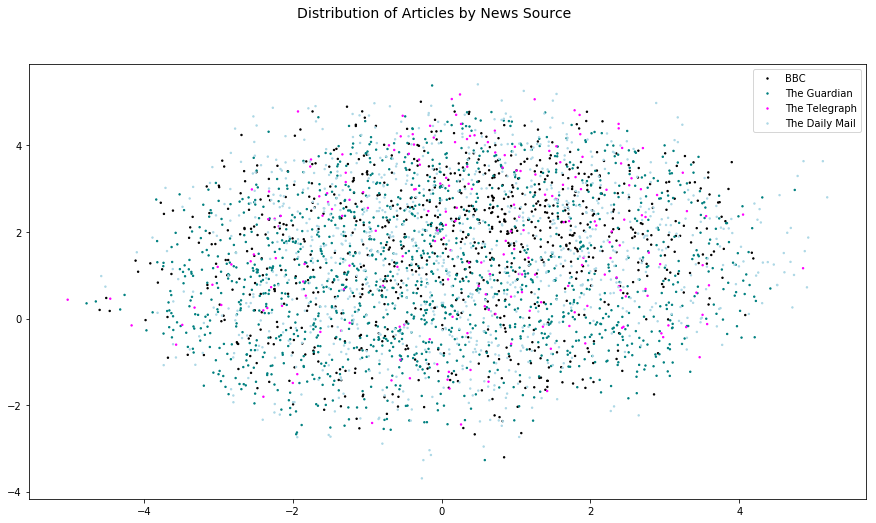

In [12]:

source_map = {'bbc-news': 'black',
              'the-guardian-uk': 'teal',
              'the-telegraph': 'magenta',
              'daily-mail': 'lightblue'}
source_color = [source_map[doc.source] for doc in docs]

def plot_docvecs(docs, color, title):
    fig = plt.figure(figsize=(15,8))
    plt.suptitle(title, fontsize=14)
    
    for c in ['black', 'teal', 'magenta', 'lightblue']:
        
        x = [doc.dim_one for col, doc in zip(color,docs) if col == c]
        y = [doc.dim_two for col, doc in zip(color,docs) if col == c]
        plt.scatter(x, y, c=c,
                    cmap=plt.cm.Spectral, marker='o', s=(2,2))
    
    plt.legend(('BBC', 'The Guardian', 'The Telegraph', 'The Daily Mail'))
    plt.axis('tight')
    plt.show()
    
plot_docvecs(docs, source_color, 'Distribution of Articles by News Source')

bbc-news
Efforts will resume on Monday to persuade the EU to agree changes to the "backstop" plan to prevent the return of customs checks on the Irish border. And Culture Secretary Jeremy Wright has hinted MPs' concerns about it could be addressed without reopening the deal. Labour says the Tories cannot be united and has called for cross-party talks. The UK remains on course to leave the EU on 29 March. But Mrs May has been unable to convince a majority of MPs to back the withdrawal terms she struck with the EU last year. The prime minister told MPs in the letter she will return to Brussels to meet European Commission President Jean-Claude Juncker this week, and speak to the leaders of every EU member state over the coming days. Her main goal is to win concessions over the backstop, which is widely disliked by members of her party. Many fear it will mean the UK staying closely aligned to EU rules for the long term, without Britain being able to end the agreement unilaterally. But EU l

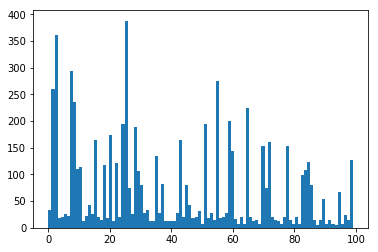

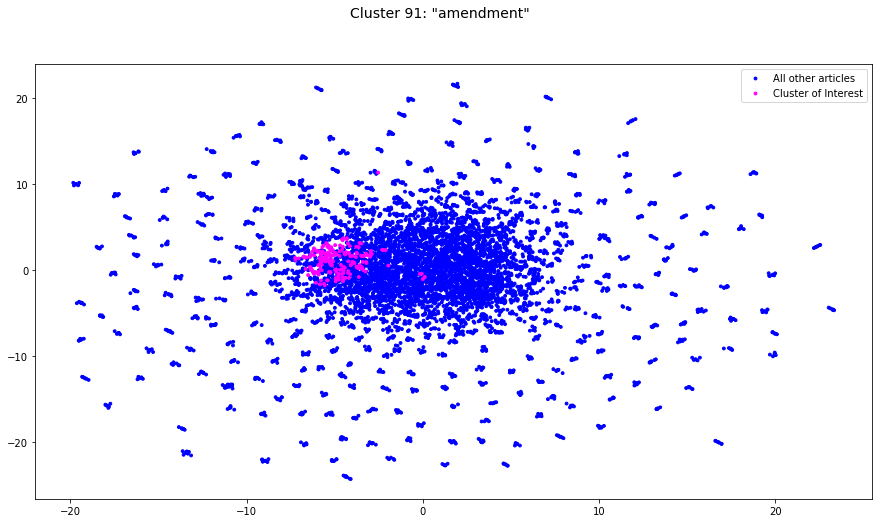

In [194]:
import numpy as np

def plot_docvecs(docs, color, title):
    fig = plt.figure(figsize=(15,8))
    plt.suptitle(title, fontsize=14)
    
    for c in ['blue', 'magenta']:
        
        x = [doc.dim_one for col, doc in zip(color,docs) if col == c]
        y = [doc.dim_two for col, doc in zip(color,docs) if col == c]
        plt.scatter(x, y, c=c,
                    cmap=plt.cm.Spectral, marker='o', s=(8,8))
    
    plt.legend(('All other articles', 'Cluster of Interest'))
    plt.axis('tight')
    plt.show()

bins = np.max(labels) - np.min(labels) + 1

# Organize labels by frequency
histogram = plt.hist(labels, bins=bins)
sorted_hist = np.argsort(histogram[0])
printed = 0

cluster = 91

isolate_cluster = ['blue'] * len(labels)

for i, label in enumerate(labels):
    if sorted_hist[cluster] == label and printed < 10:
        printed += 1
        print(docs[i].source)
        print(docs[i].body[:1000], '...\n')
    if sorted_hist[cluster] == label:
        isolate_cluster[i] = 'magenta'
max_tfidf = 0
for tfidf in (grouping.clusters[cluster].top_words[0],
              grouping.clusters[cluster].top_bigrams[0],
              grouping.clusters[cluster].top_trigrams[0]):
    if tfidf[1] > max_tfidf:
        max_tfidf = tfidf[1]
        best_word = tfidf[0]


plot_docvecs(docs, isolate_cluster, f'Cluster {cluster}: \"{best_word}\"')

In [192]:
len(docs)

6826

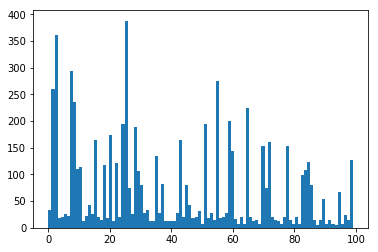

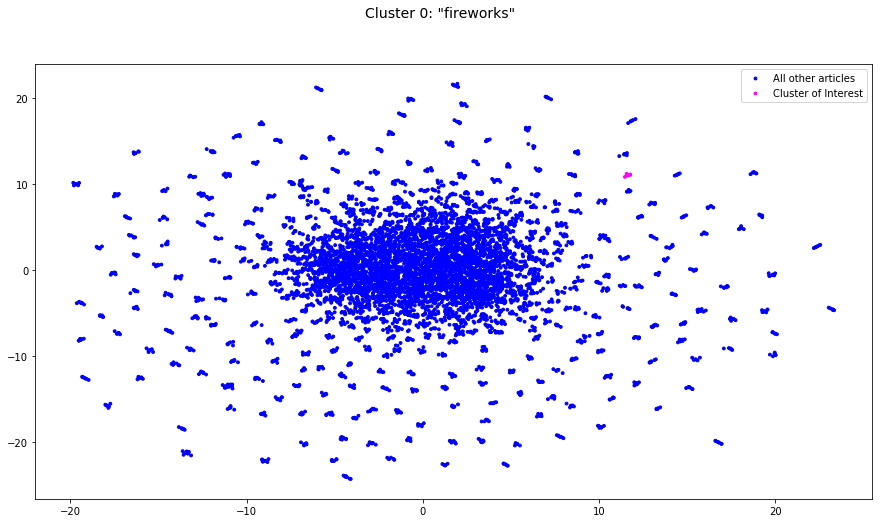

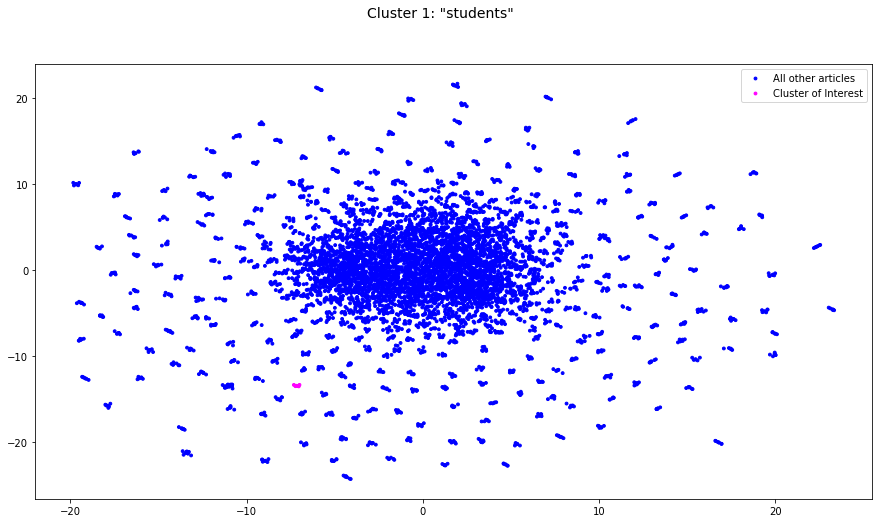

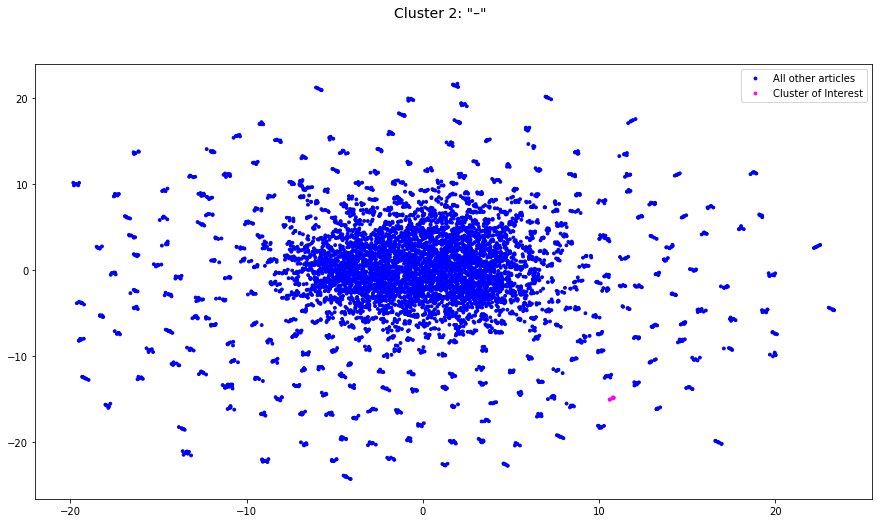

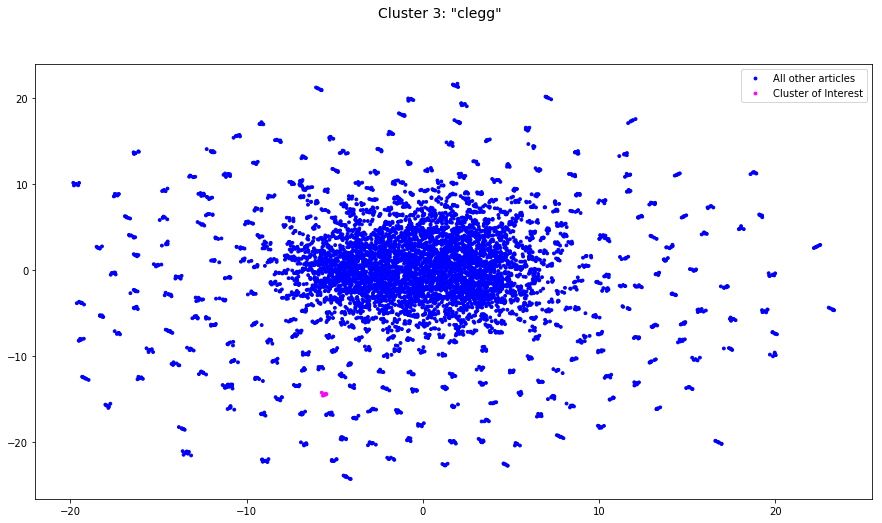

...

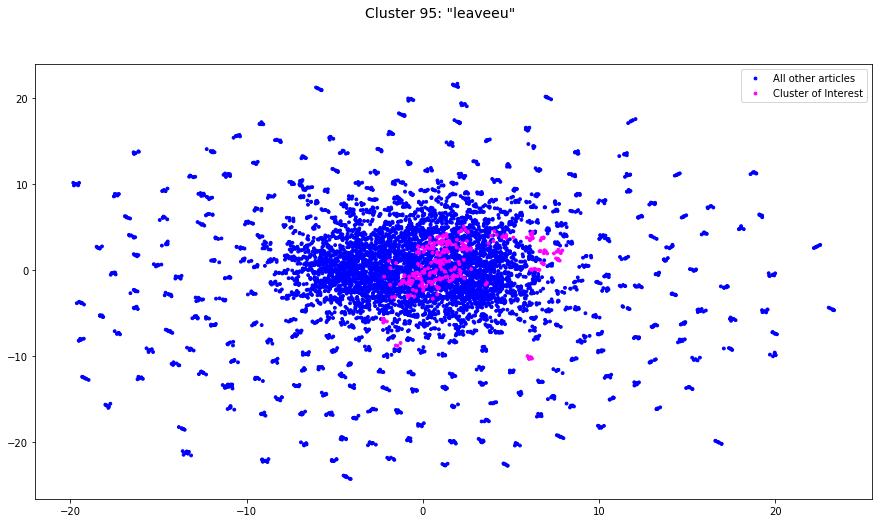

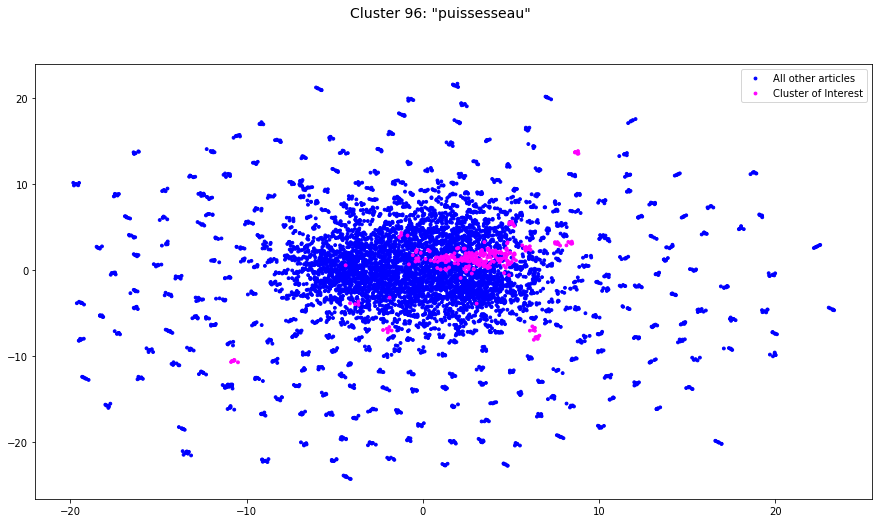

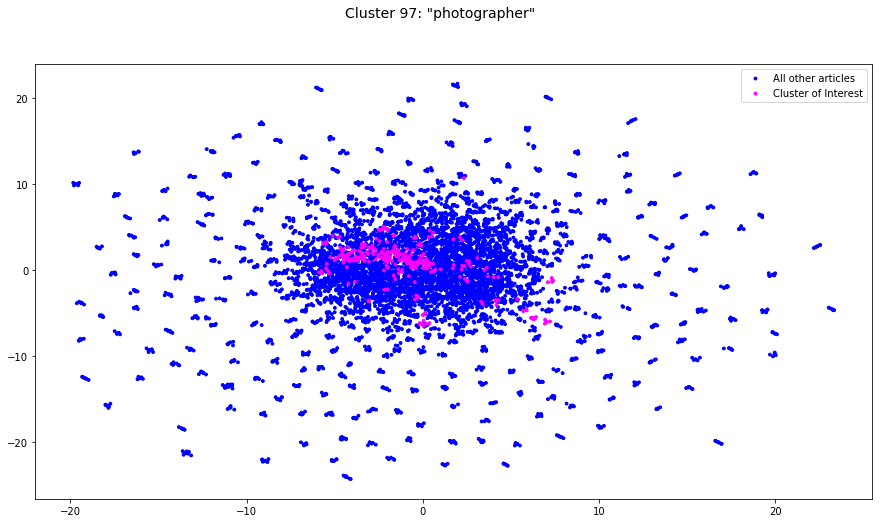

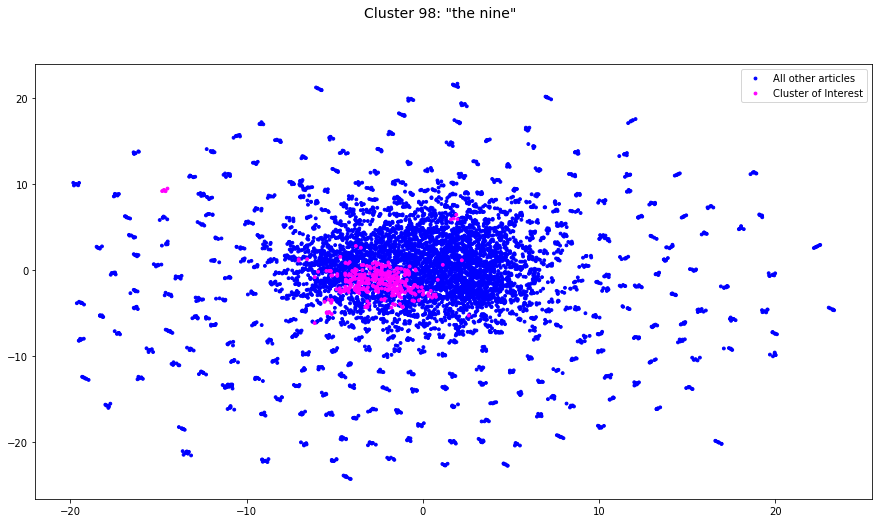

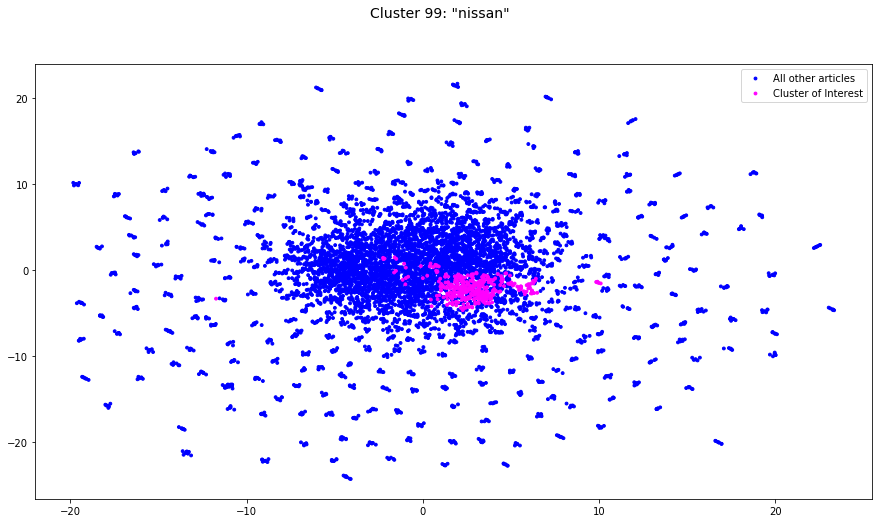

In [180]:
import numpy as np

def plot_docvecs(docs, color, title):
    fig = plt.figure(figsize=(15,8))
    plt.suptitle(title, fontsize=14)
    
    for c in ['blue', 'magenta']:
        
        x = [doc.dim_one for col, doc in zip(color,docs) if col == c]
        y = [doc.dim_two for col, doc in zip(color,docs) if col == c]
        plt.scatter(x, y, c=c,
                    cmap=plt.cm.Spectral, marker='o', s=(8,8))
    
    plt.legend(('All other articles', 'Cluster of Interest'))
    plt.axis('tight')
    plt.show()

bins = np.max(labels) - np.min(labels) + 1

# Organize labels by frequency
histogram = plt.hist(labels, bins=bins)
sorted_hist = np.argsort(histogram[0])
printed = 0

cluster = 81

for cluster in range(100):
    isolate_cluster = ['blue'] * len(labels)

    for i, label in enumerate(labels):
        if sorted_hist[cluster] == label and printed < 10:
            printed += 1
            #print(docs[i].body[:1000], '...\n')
        if sorted_hist[cluster] == label:
            isolate_cluster[i] = 'magenta'

    max_tfidf = 0
    for tfidf in (grouping.clusters[cluster].top_words[0],
                  grouping.clusters[cluster].top_bigrams[0],
                  grouping.clusters[cluster].top_trigrams[0]):
        if tfidf[1] > max_tfidf:
            max_tfidf = tfidf[1]
            best_word = tfidf[0]


    plot_docvecs(docs, isolate_cluster, f'Cluster {cluster}: \"{best_word}\"')